In [1]:
%matplotlib inline 
import cv2, os, ast, time, math, shutil, sys, glob 
from datetime import datetime
from PIL import Image
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
tqdm.pandas() 
from joblib import Parallel, delayed

import torch
import torchvision
from torchvision.ops import box_iou
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from matplotlib.image import imread
from typing import List
from mAP import mean_average_precision 
from torchinfo import summary

In [2]:
%cd yolov7
cwd = os.getcwd()

h:\Python\ob\train_models\YOLO\yolov7


In [25]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
ckpt_path = 'H:/Python/ob/train_models/YOLO/runs_yolov7_1920_1080/weights/best.pt'

In [26]:
from models.experimental import attempt_load 
from utils.datasets import LoadImages
from utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression
model = attempt_load(ckpt_path, map_location=device)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block


In [27]:
summary(model)

Layer (type:depth-idx)                   Param #
Model                                    --
├─Sequential: 1-1                        --
│    └─Conv: 2-1                         --
│    │    └─Conv2d: 3-1                  (896)
│    │    └─SiLU: 3-2                    --
│    └─Conv: 2-2                         --
│    │    └─Conv2d: 3-3                  (18,496)
│    │    └─SiLU: 3-4                    --
│    └─Conv: 2-3                         --
│    │    └─Conv2d: 3-5                  (36,928)
│    │    └─SiLU: 3-6                    --
│    └─Conv: 2-4                         --
│    │    └─Conv2d: 3-7                  (73,856)
│    │    └─SiLU: 3-8                    --
│    └─Conv: 2-5                         --
│    │    └─Conv2d: 3-9                  (8,256)
│    │    └─SiLU: 3-10                   --
│    └─Conv: 2-6                         --
│    │    └─Conv2d: 3-11                 (8,256)
│    │    └─SiLU: 3-12                   --
│    └─Conv: 2-7                        

In [5]:
def detect_cots(img_path, model, img_size, stride, device): 
    dataset = LoadImages(img_path, img_size=img_size, stride=stride)

    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device).float()
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
            img = img.unsqueeze(0)
    # Inference
        #print(im0s)
        #print(img[:, 2, 100, 500])
        t0 = time.time()
        pred = model(img, augment=None)[0]
        pred = non_max_suppression(pred) #opt.iou_thres, classes=opt.classes, agnostic=opt.agnostic_nms)
        inference_time = time.time() - t0
        del img
        torch.cuda.empty_cache()
    return pred, inference_time

def yolo2xy(bboxes, height=720, width=1280):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    coco => [xmin, ymin, w, h]
    
    """ 
    # denormalizing
    bboxes[..., 0::2] *= width
    bboxes[..., 1::2] *= height
    
    # converstion (xmid, ymid) => (xmin, ymin) 
    bboxes[..., 0:2] -= bboxes[..., 2:4]/2
    bboxes[:,[2]] += bboxes[:,[0]]
    bboxes[:,[3]] += bboxes[:,[1]]
    
    return bboxes

307    /yolov7/cots\images/val\1-5517.jpg
150    /yolov7/cots\images/val\0-9275.jpg
167    /yolov7/cots\images/val\0-9430.jpg
183     /yolov7/cots\images/val\0-964.jpg
Name: img_path, dtype: object


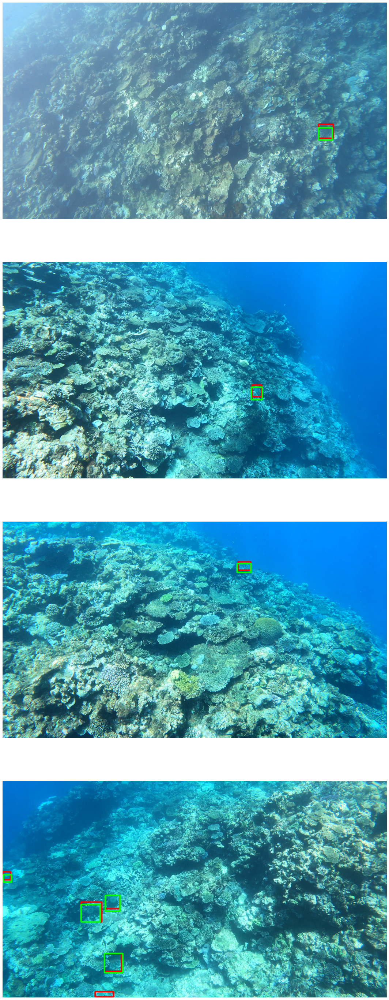

In [14]:
df_val = pd.read_csv('./cots/val.txt', header=None, names=['img_path'])
random_sample = np.random.randint(0, 491, size=4)
print(df_val.iloc[random_sample.tolist()]['img_path'].str[30:])
preds = []
bboxes = []
col_names={0:'class', 1:'x_mid', 2:'y_mid', 3:'w_ratio', 4:'h_ratio'}

fig, ax = plt.subplots(4, 1, figsize=(100, 50))

for i in range(len(random_sample)):
    img_path = df_val.img_path[random_sample[i]]
    label_path = img_path.replace('jpg', 'txt')
    label_path = label_path.replace('images', 'labels')
    img = imread(img_path).astype(np.int32)
    pred, infer_time = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
    pred = pred[0].detach().cpu().numpy()
    preds.append(pred)
    pred_box = pred[:, 0:4].astype(np.int32)
    pred_conf = pred[:, 4]
    #print(pred_box, pred_conf)
    bbox = pd.read_csv(label_path, sep=' ', header=None)
    bbox = bbox.rename(columns=col_names)
    bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
    bboxes.append(bbox.to_numpy())
    gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32)
    #print(gt_box)
    
    # Red for ground truth
    for box in gt_box:
        cv2.rectangle(img,(box[0], box[1]),(box[2], box[3]),(255, 0, 0), 3)

    # Green for predictions
    for box in pred_box:
        cv2.rectangle(img,(box[0], box[1]),(box[2], box[3]),(0, 255, 0), 3)
        
    ax[i-1].set_axis_off()
    ax[i-1].imshow(img)

0    /yolov7/cots\images/train\1-9322.jpg
Name: img_path, dtype: object


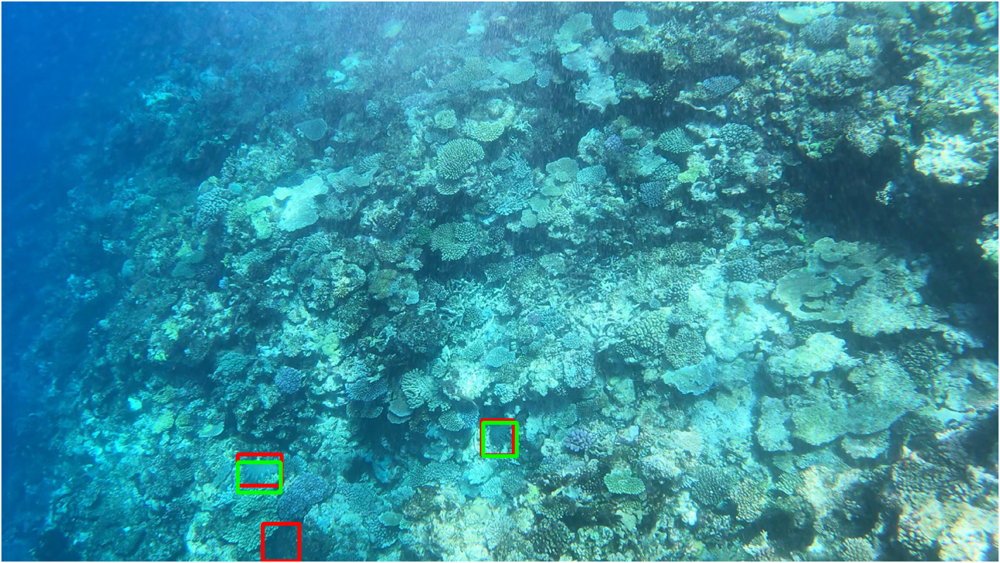

In [15]:
df_train = pd.read_csv('./cots/train.txt', header=None, names=['img_path'])
random_sample = np.array([0])
print(df_train.iloc[random_sample.tolist()]['img_path'].str[30:])
preds = []
bboxes = []
col_names={0:'class', 1:'x_mid', 2:'y_mid', 3:'w_ratio', 4:'h_ratio'}

fig, ax = plt.subplots(1, 1, figsize=(100, 50))

for i in range(len(random_sample)):
    img_path = df_train.img_path[random_sample[i]]
    label_path = img_path.replace('jpg', 'txt')
    label_path = label_path.replace('images', 'labels')
    img = imread(img_path).astype(np.int32)
    pred, infer_time = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
    pred = pred[0].detach().cpu().numpy()
    preds.append(pred)
    pred_box = pred[:, 0:4].astype(np.int32)
    pred_conf = pred[:, 4]
    #print(pred_box, pred_conf) 
    bbox = pd.read_csv(label_path, sep=' ', header=None)
    bbox = bbox.rename(columns=col_names)
    bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
    bboxes.append(bbox.to_numpy())
    gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32)
    #print(gt_box)
    
    # Red for ground truth
    for box in gt_box:
        cv2.rectangle(img,(box[0], box[1]),(box[2], box[3]),(255, 0, 0), 3)

    # Green for predictions
    for box in pred_box:
        cv2.rectangle(img,(box[0], box[1]),(box[2], box[3]),(0, 255, 0), 3)
        
    ax.set_axis_off()
    ax.imshow(img)

In [9]:
def calculate_score(preds: List[torch.Tensor], gts: List[torch.Tensor], iou_th: float) -> float:
    num_tp = 0
    num_fp = 0
    num_fn = 0
    for p, GT in zip(preds, gts):
        if len(p) and len(GT):
            gt = GT.clone()
            gt[:, 2] = gt[:, 0] + gt[:, 2]
            gt[:, 3] = gt[:, 1] + gt[:, 3]
            pp = p.clone()
            pp[:, 2] = pp[:, 0] + pp[:, 2]
            pp[:, 3] = pp[:, 1] + pp[:, 3]
            iou_matrix = box_iou(pp, gt)
            tp = len(torch.where(iou_matrix.max(0)[0] >= iou_th)[0])
            fp = len(p) - tp
            fn = len(torch.where(iou_matrix.max(0)[0] < iou_th)[0])
            num_tp += tp
            num_fp += fp
            num_fn += fn
        elif len(p) == 0 and len(GT):
            num_fn += len(GT)
        elif len(p) and len(GT) == 0:
            num_fp += len(p)
    score = 5 * num_tp / (5 * num_tp + 4 * num_fn + num_fp)
    return score

In [10]:
df_val = pd.read_csv('./cots/val.txt', header=None, names=['img_path'])
df_train = pd.read_csv('./cots/train.txt', header=None, names=['img_path'])
col_names={0:'class', 1:'x_mid', 2:'y_mid', 3:'w_ratio', 4:'h_ratio'}

In [11]:
# F2 score on training data and test data
preds = []
gts = []
infer_time_train = []
time_begin = time.time()
 
with torch.no_grad():
    for i in range(df_train.shape[0]):
        img_path = df_train.img_path[i]
        label_path = img_path.replace('jpg', 'txt')
        label_path = label_path.replace('images', 'labels')
        pred, inference_time = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
        infer_time_train.append(inference_time)
        pred = pred[0].cpu().detach()
        pred_box = pred[:, 0:4]
        preds.append(pred_box)
        bbox = pd.read_csv(label_path, sep=' ', header=None)
        bbox = bbox.rename(columns=col_names)
        bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
        gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32)
        gts.append(torch.tensor(gt_box))
        del pred
        torch.cuda.empty_cache()
    
print('Inference Time Used: {:.2f} seconds'.format(time.time()- time_begin))
iou_ths = np.arange(0.3, 0.85, 0.05)
scores = [calculate_score(preds, gts, iou_th) for iou_th in iou_ths]
print('Avg inference time for training set:', np.mean(infer_time_train))
print('Training average F2 score is {:.3f}'.format(np.mean(scores))) 


preds = []
gts = []
infer_time_val = []
time_begin = time.time()

with torch.no_grad():
    for i in range(df_val.shape[0]):
        img_path = df_val.img_path[i]
        label_path = img_path.replace('jpg', 'txt')
        label_path = label_path.replace('images', 'labels')
        pred,  inference_time = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
        infer_time_val.append(inference_time)
        pred = pred[0].cpu().detach()
        pred_box = pred[:, 0:4]
        preds.append(pred_box)
        bbox = pd.read_csv(label_path, sep=' ', header=None)
        bbox = bbox.rename(columns=col_names)
        bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
        gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32)
        gts.append(torch.tensor(gt_box))
        del pred
        torch.cuda.empty_cache()
    
print('Inference Time Used: {:.2f} seconds'.format(time.time()- time_begin))
iou_ths = np.arange(0.3, 0.85, 0.05)
scores = [calculate_score(preds, gts, iou_th) for iou_th in iou_ths]
print('Avg inference time for validation set:', np.mean(infer_time_val))
print('Training average F2 score is {:.3f}'.format(np.mean(scores))) 

Inference Time Used: 551.12 seconds
Avg inference time for training set: 0.05023924281695693
Training average F2 score is 0.927
Inference Time Used: 59.22 seconds
Avg inference time for validation set: 0.05036779487036108
Training average F2 score is 0.923


In [12]:
# mAP score on training data and test data
pred_boxes_map = []
true_boxes_map = []

time_begin = time.time()
 
with torch.no_grad():
    for idx in range(df_train.shape[0]):
        img_path = df_train.img_path[idx]
        label_path = img_path.replace('jpg', 'txt')
        label_path = label_path.replace('images', 'labels')
        pred, _ = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
        pred = pred[0].cpu().detach().tolist()
        for i in range(len(pred)): 
            a = [idx, 0, pred[i][4]] + pred[i][0:4]
            pred_boxes_map.append(a)
        
        bbox = pd.read_csv(label_path, sep=' ', header=None)
        bbox = bbox.rename(columns=col_names)
        bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
        gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32).tolist() 
        for j in range(len(gt_box)): 
            b = [idx, 0, 1] + gt_box[j]
            true_boxes_map.append(b)
        del pred
        torch.cuda.empty_cache()
    
print('Inference Time Used: {:.2f} seconds'.format(time.time()- time_begin))
        
mean_ap_train = mean_average_precision(pred_boxes_map, true_boxes_map, 
                                       iou_threshold=0.5, box_format="midpoint", num_classes=1)
print('mAP on training set is:', mean_ap_train)

pred_boxes_map = []
true_boxes_map = []

time_begin = time.time()
 
with torch.no_grad():
    for idx in range(df_val.shape[0]):
        img_path = df_val.img_path[idx]
        label_path = img_path.replace('jpg', 'txt')
        label_path = label_path.replace('images', 'labels')
        pred, _ = detect_cots(img_path, model=model, img_size=1280, stride=32, device=device)
        pred = pred[0].cpu().detach().tolist()
        for i in range(len(pred)): 
            a = [idx, 0, pred[i][4]] + pred[i][0:4]
            pred_boxes_map.append(a)
        
        bbox = pd.read_csv(label_path, sep=' ', header=None)
        bbox = bbox.rename(columns=col_names)
        bbox = bbox[['x_mid', 'y_mid', 'w_ratio', 'h_ratio']]
        gt_box = yolo2xy(bbox.to_numpy()).astype(np.int32).tolist() 
        for j in range(len(gt_box)): 
            b = [idx, 0, 1] + gt_box[j]
            true_boxes_map.append(b)
        del pred
        torch.cuda.empty_cache()
    
print('Inference Time Used: {:.2f} seconds'.format(time.time()- time_begin))
        
mean_ap_val = mean_average_precision(pred_boxes_map, true_boxes_map, 
                                       iou_threshold=0.5, box_format="midpoint", num_classes=1)
print('mAP on training set is:', mean_ap_val)


Inference Time Used: 533.43 seconds
mAP on training set is: tensor(0.91840)
Inference Time Used: 60.67 seconds
mAP on training set is: tensor(0.91118)
